# Computer_Vision/Assignment_1/MDS201803

Importing basic packages

In [1]:
import cv2
import numpy as np
from PIL import Image
from fractions import Fraction 
from matplotlib import pyplot as plt
from matplotlib.pyplot import imshow
import matplotlib.pyplot as plt
from skimage.exposure import rescale_intensity

## (Q.1) Convert a color image into a grayscale image

In [2]:
img = Image.open('Images/Images/hill.png')

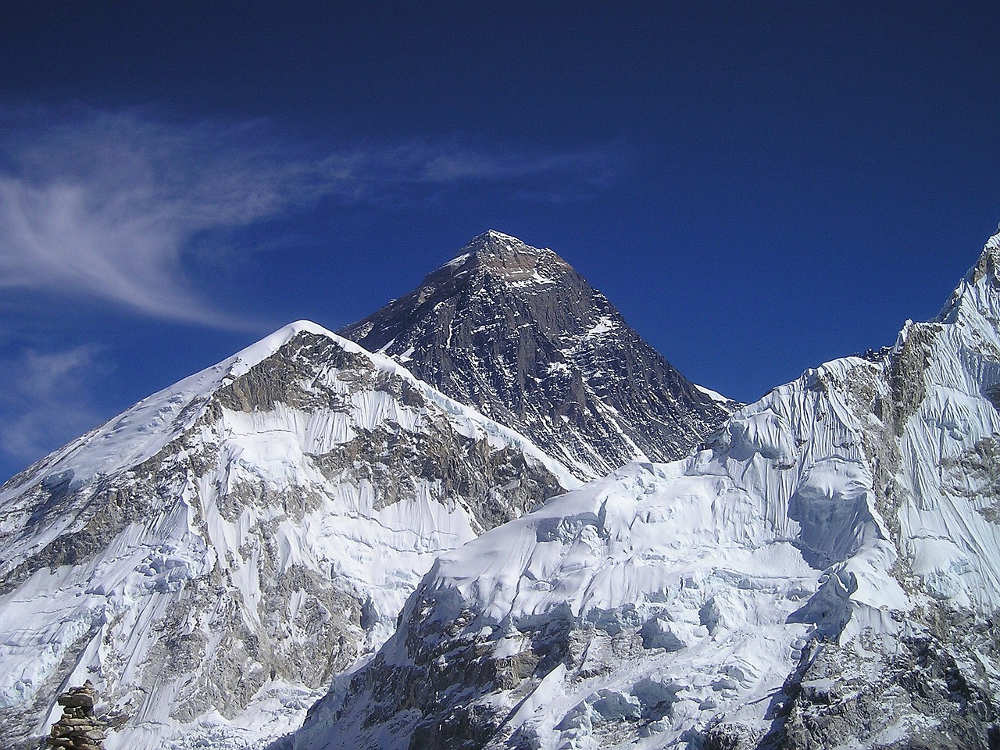

In [3]:
img

In [4]:
# Converting the image in grayscale
img_gray = img.convert('LA')

In [5]:
# Saving the image
img_gray.save('hill_gray.png')

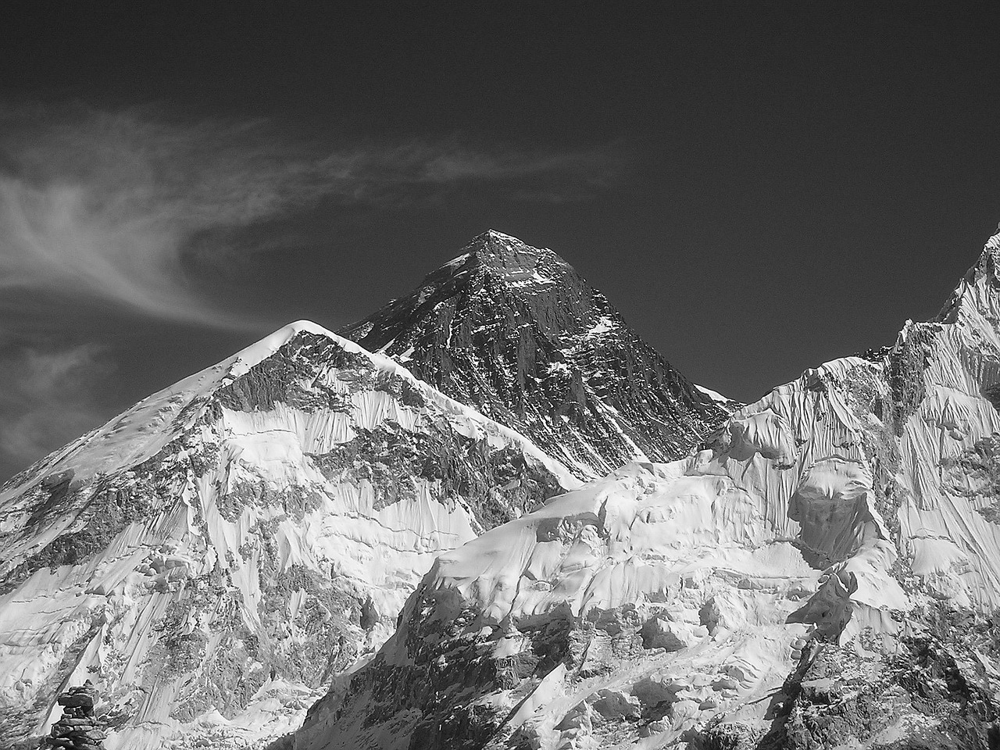

In [6]:
img_gray

## (Q.2)(a) Read in a grayscale image and linearize the intensity values

In [7]:
def load_image( input_file_path ) :
    # this function returns the numpy array corresponding the image
    image = Image.open( input_file_path )
    data = np.array( image )
    print("Dimension of the image : ", image.size)
    print("Max : ", np.max(data))
    print("Min : ", np.min(data))
    print("Image format : ",image.format)
    print("Image Mode : ", image.mode)
    return data

def print_image_outline( npdata ):
    img = Image.fromarray(np.asarray( np.clip(npdata,0,255), dtype="uint8"))
    %matplotlib inline
    return img.show()
    
def print_image_inline( npdata ):
    return imshow(npdata, cmap = 'gray')

def save_image( npdata, outfilename ) :
    img = Image.fromarray( np.asarray( np.clip(npdata,0,255), dtype="uint8") )
    img.save( outfilename )

In [8]:
data = load_image("/media/subhasish/Professional/CMI/Sem_4/CV/assignments/Images/Images/einstein.jpg")

Dimension of the image :  (540, 720)
Max :  255
Min :  0
Image format :  JPEG
Image Mode :  L


In [9]:
data

array([[ 61,  62,  61, ...,  25,  25,  25],
       [ 57,  63,  61, ...,  24,  24,  24],
       [ 62,  62,  59, ...,  23,  24,  24],
       ...,
       [ 23,  16,  13, ..., 127,  47,  38],
       [ 21,  16,  13, ..., 117,  73,  31],
       [ 17,  17,  16, ...,  65,  64,  47]], dtype=uint8)

As we can see the integer values range from $0$ to $255$, i.e. a total of $256 = 2^8$. Thus there are **$8$ bits** per integer are there in the image.

The Height and Width of the image is **$720$ pixels** and **$540$ pixels** respectively.

In [10]:
# Converting the array into double precision array
data_double = data.astype('float32')

In [11]:
data_double

array([[ 61.,  62.,  61., ...,  25.,  25.,  25.],
       [ 57.,  63.,  61., ...,  24.,  24.,  24.],
       [ 62.,  62.,  59., ...,  23.,  24.,  24.],
       ...,
       [ 23.,  16.,  13., ..., 127.,  47.,  38.],
       [ 21.,  16.,  13., ..., 117.,  73.,  31.],
       [ 17.,  17.,  16., ...,  65.,  64.,  47.]], dtype=float32)

In [12]:
data_double.dtype

dtype('float32')

## (Q.2)(b) Linearizing the image

Converting the image into an array within the range $[0,1]$.This linear normalization of the grayscale digital image is performed according to the formula..

\begin{equation}
I_N=(I-\text{Min})\frac{\text{NewMax}-\text{NewMin}}{\text{Max}-\text{Min}}+\text{NewMin}
\end{equation}

Here, 
- $I_N$ = Pixle values of the Normalized Image  
- [Min, Max] = Intensity bounds of the old image
- [NewMin, NewMax] = Intensity bounds of the Normalized image

In [13]:
data_scaled = data_double/255.0

In [14]:
data_scaled.dtype

dtype('float32')

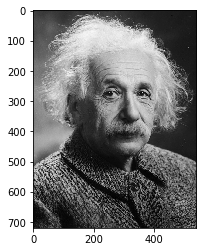

In [15]:
print_image_inline(data_scaled)

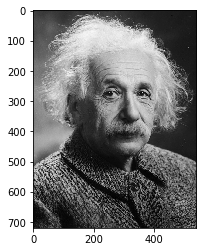

In [16]:
image_linearized = data_scaled*255
print_image_inline(image_linearized)

In [17]:
image_linearized.dtype

dtype('float32')

In [18]:
save_image(image_linearized, 'linearized.jpg')

## (Q.4) Padding

In [19]:
def padding(image_path, target_size=(512, 512), borderType = 'constant', mode = 1, width = 1, value = (255,255,255)):
    # This function uses constant padding of black colour by default
    
    # reads an image 
    img = cv2.imread(image_path)   
    im = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
    
    # define the padding width
    pad_height_top = 10*width
    pad_height_bottom = 10*width
    pad_width_left = 10*width
    pad_width_right = 10*width
    
    
    if borderType == 'constant':
        pad_im = cv2.copyMakeBorder(im, pad_height_top, pad_height_bottom, pad_width_left, pad_width_right, cv2.BORDER_CONSTANT, value = value)
    elif borderType == 'zero':
        pad_im = cv2.copyMakeBorder(im, pad_height_top, pad_height_bottom, pad_width_left, pad_width_right, cv2.BORDER_CONSTANT, value = (0, 0, 0))    
    elif borderType == 'clamp':
        pad_im = cv2.copyMakeBorder(im, pad_height_top, pad_height_bottom, pad_width_left, pad_width_right, cv2.BORDER_REPLICATE, value = value)    
    elif borderType == 'mirror':
        pad_im = cv2.copyMakeBorder(im, pad_height_top, pad_height_bottom, pad_width_left, pad_width_right, cv2.BORDER_REFLECT, value = value)    
    
    return pad_im 



Plotting the padded images

### Constant Padding

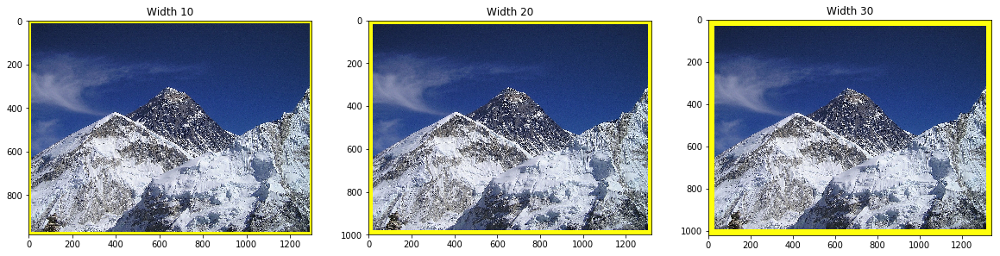

In [20]:
fig = plt.figure(figsize=(20,10))


# show original image
fig.add_subplot(131)
plt.title('Width 10')
plt.imshow(padding('Images/Images/hill.png', borderType = 'constant', width = 1, value = (255,255,12)))

fig.add_subplot(132)
plt.title('Width 20')
plt.imshow(padding('Images/Images/hill.png', borderType = 'constant', width = 2, value = (255,255,12)))

fig.add_subplot(133)
plt.title('Width 30')
plt.imshow(padding('Images/Images/hill.png', borderType = 'constant', width = 3, value = (255,255,12)))

plt.show() 

### Zero Padding

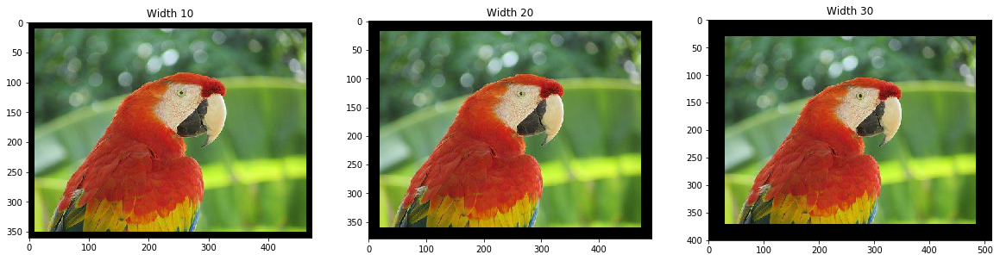

In [21]:
fig = plt.figure(figsize=(20,10))


# show original image
fig.add_subplot(131)
plt.title('Width 10')
plt.imshow(padding('Images/Images/parrot.png', borderType = 'zero', width = 1))

fig.add_subplot(132)
plt.title('Width 20')
plt.imshow(padding('Images/Images/parrot.png', borderType = 'zero', width = 2))

fig.add_subplot(133)
plt.title('Width 30')
plt.imshow(padding('Images/Images/parrot.png', borderType = 'zero', width = 3))

plt.show() 

### Clamp Padding

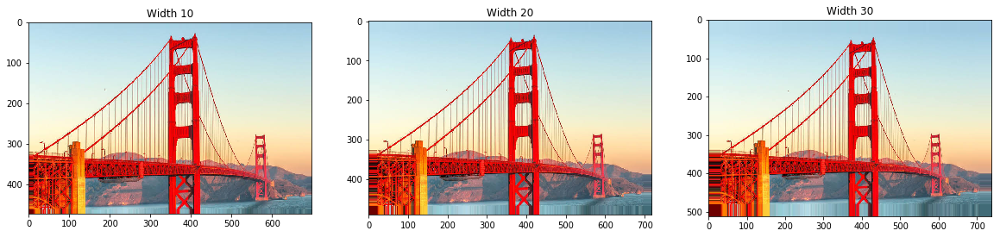

In [22]:
fig = plt.figure(figsize=(20,10))


# show original image
fig.add_subplot(131)
plt.title('Width 10')
plt.imshow(padding('Images/Images/golden_gate.jpeg', borderType = 'clamp', width = 1))

fig.add_subplot(132)
plt.title('Width 20')
plt.imshow(padding('Images/Images/golden_gate.jpeg', borderType = 'clamp', width = 2))

fig.add_subplot(133)
plt.title('Width 30')
plt.imshow(padding('Images/Images/golden_gate.jpeg', borderType = 'clamp', width = 3))

plt.show() 

### Mirror Padding

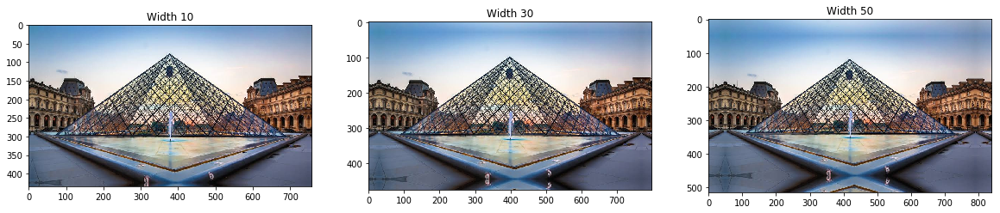

In [23]:
fig = plt.figure(figsize=(20,10))


# show original image
fig.add_subplot(131)
plt.title('Width 10')
plt.imshow(padding('Images/Images/louvre.jpeg', borderType = 'mirror', width = 1))

fig.add_subplot(132)
plt.title('Width 30')
plt.imshow(padding('Images/Images/louvre.jpeg', borderType = 'mirror', width = 3))

fig.add_subplot(133)
plt.title('Width 50')
plt.imshow(padding('Images/Images/louvre.jpeg', borderType = 'mirror', width = 5))

plt.show() 

Saving the images

In [24]:
save_image(padding('Images/Images/hill.png', borderType = 'constant', width = 1, value = (255,255,12)), 'hill_padded_1.jpg')
save_image(padding('Images/Images/hill.png', borderType = 'constant', width = 2, value = (255,255,12)), 'hill_padded_2.jpg')
save_image(padding('Images/Images/hill.png', borderType = 'constant', width = 3, value = (255,255,12)), 'hill_padded_3.jpg')

save_image(padding('Images/Images/parrot.png', borderType = 'zero', width = 1), 'parrot_padded_1.jpg')
save_image(padding('Images/Images/parrot.png', borderType = 'zero', width = 2), 'parrot_padded_2.jpg')
save_image(padding('Images/Images/parrot.png', borderType = 'zero', width = 3), 'parrot_padded_3.jpg')

save_image(padding('Images/Images/louvre.jpeg', borderType = 'mirror', width = 1), 'louvre_padded_1.jpg')
save_image(padding('Images/Images/louvre.jpeg', borderType = 'mirror', width = 2), 'louvre_padded_2.jpg')
save_image(padding('Images/Images/louvre.jpeg', borderType = 'mirror', width = 3), 'louvre_padded_3.jpg')

save_image(padding('Images/Images/golden_gate.jpeg', borderType = 'clamp', width = 1), 'ggate_padded_1.jpg')
save_image(padding('Images/Images/golden_gate.jpeg', borderType = 'clamp', width = 2), 'ggate_padded_2.jpg')
save_image(padding('Images/Images/golden_gate.jpeg', borderType = 'clamp', width = 3), 'ggate_padded_3.jpg')

## (Q.5) Convolution

In [25]:
def convolve(image, kernel, kernel_type):    
    
    (image_height, image_width) = image.shape[:2]
    (kernel_height, kernel_width) = kernel.shape[:2]
 
    # The image is padded according to the size of the kernel
    padding = (kernel_width - 1) // 2
    image = cv2.copyMakeBorder(image, padding, padding, padding, padding, cv2.BORDER_REPLICATE)
    
    # Initializaing the output matrix
    output = np.zeros((image_height, image_width), dtype="float32")
    
    for y in np.arange(padding, image_height + padding):
        for x in np.arange(padding, image_width + padding):
            pixle = image[y - padding:y + padding + 1, x - padding:x + padding + 1]
            
            if (kernel_type == 'gaussian') or (kernel_type == 'box'):
                k = np.sum(pixle * kernel*(1/np.sum(kernel)))
            elif kernel_type == 'median':
                k = np.median(pixle * kernel)
 
            output[y - padding, x - padding] = k
   
    output = rescale_intensity(output, in_range=(0, 255))
    output = (output * 255).astype("uint8")
    return output

In [26]:
def convolution(image_path, kernel_height, kernel_width, kernel_type, print_image = True):
    img = cv2.imread(image_path)   
    Original = load_image(image_path)
    # Creates the kernel from its two separable components viz. kernel_height & kernel_width`
    
    #kernel = laplacian
    kernel = np.outer(kernel_height.ravel(), kernel_width.ravel())
    if kernel_type == 'gaussian':
        print('The kernel used is : \n',kernel,(1/np.sum(kernel)))
    
    if len(img) != 2:
        b, g, r    = img[:, :, 0], img[:, :, 1], img[:, :, 2]
        r_transformed = convolve(r, kernel, kernel_type)
        g_transformed = convolve(g, kernel,kernel_type)
        b_transformed = convolve(b, kernel, kernel_type)
        convolved_image = np.dstack((r_transformed, g_transformed, b_transformed))
    else:
        convolved_image = convolve(data, kernel)
    
    if print_image :
        # return the output convoluted image    
        fig = plt.figure(figsize=(20,10))
        
        # Plotting the original and Convoluted image
        fig.add_subplot(131)
        plt.title('Original Image')
        plt.imshow(Original, cmap = 'gray')

        fig.add_subplot(132)
        plt.title('Convolved Image')
        plt.imshow(convolved_image)

        plt.show()    
    else:
        return convolved_image

## Gaussian Filter

Using a 3x3 Gaussian filter given as follows : <br>
$\begin{pmatrix}1 & 2 & 1\\\ 2 & 4 & 2\\\ 1 & 2 & 1 \end{pmatrix} * 1/16$

Dimension of the image :  (450, 682)
Max :  255
Min :  0
Image format :  JPEG
Image Mode :  RGB
The kernel used is : 
 [[1 2 1]
 [2 4 2]
 [1 2 1]] 0.0625


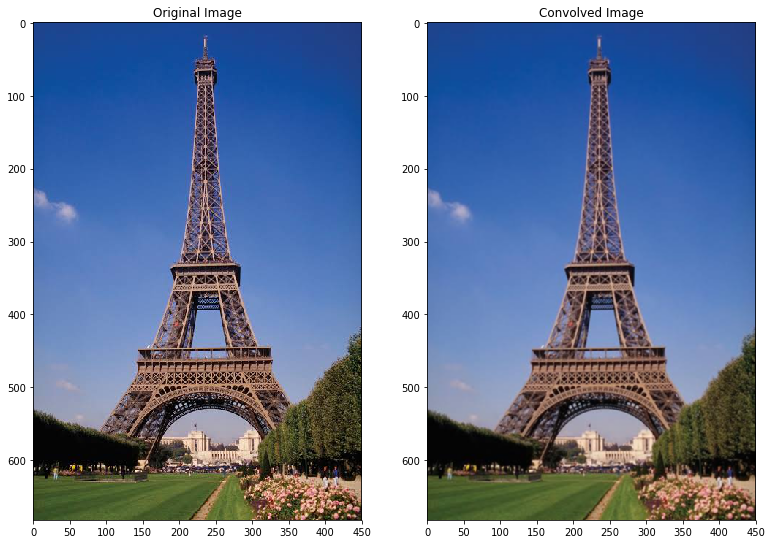

In [27]:
convolution("Images/Images/eiffel.jpeg", np.array([1, 2, 1]), np.array([1, 2, 1]), kernel_type= 'gaussian', print_image = True)

#### Using a 5x5 Gaussian filter with the vertical and horizontal kernel vector is $[1,4,6,4,1]$

Dimension of the image :  (450, 682)
Max :  255
Min :  0
Image format :  JPEG
Image Mode :  RGB
The kernel used is : 
 [[ 1  4  6  4  1]
 [ 4 16 24 16  4]
 [ 6 24 36 24  6]
 [ 4 16 24 16  4]
 [ 1  4  6  4  1]] 0.00390625


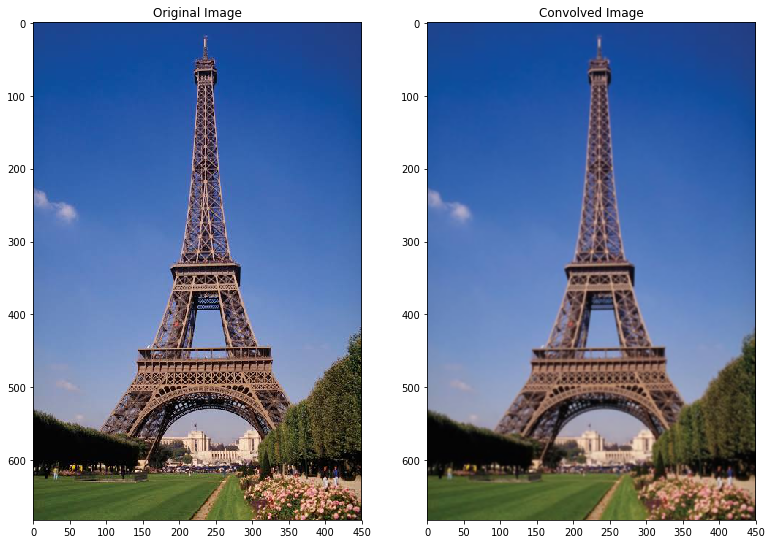

In [28]:
convolution("Images/Images/eiffel.jpeg", np.array([ 1,  4,  6,  4,  1]), np.array([ 1,  4,  6,  4,  1]), kernel_type= 'gaussian', print_image=True)

#### Using a 7x7 Gaussian filter with the vertical and horizontal kernel vector is $[0,0,1,2,1,0,0]$

In [29]:
save_image(convolution("Images/Images/eiffel.jpeg", np.array([ 1,  4,  6,  4,  1]), np.array([ 1,  4,  6,  4,  1]), kernel_type= 'gaussian', print_image=False), "eiffel_gaussian.jpg")

Dimension of the image :  (450, 682)
Max :  255
Min :  0
Image format :  JPEG
Image Mode :  RGB
The kernel used is : 
 [[ 1  4  6  4  1]
 [ 4 16 24 16  4]
 [ 6 24 36 24  6]
 [ 4 16 24 16  4]
 [ 1  4  6  4  1]] 0.00390625


Dimension of the image :  (450, 682)
Max :  255
Min :  0
Image format :  JPEG
Image Mode :  RGB
The kernel used is : 
 [[0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0]
 [0 0 1 2 1 0 0]
 [0 0 2 4 2 0 0]
 [0 0 1 2 1 0 0]
 [0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0]] 0.0625


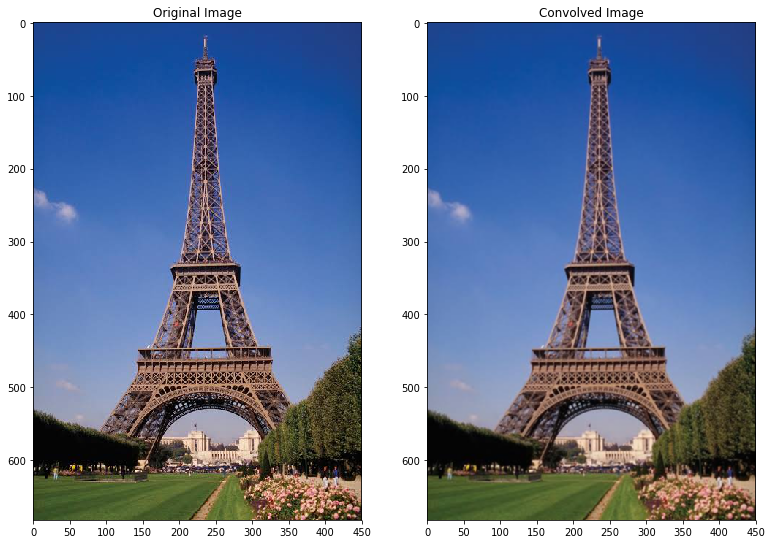

In [30]:
convolution("Images/Images/eiffel.jpeg", np.array([0,0,1,2,1,0,0]), np.array([0,0,1,2,1,0,0]), kernel_type= 'gaussian', print_image=True)

#### Using a 11x11 Gaussian filter with the vertical and horizontal kernel vector is $[0.001283,0.002106,0.003096,0.004077,0.004809,0.005081,0.004809,0.004077,0.003096,0.002106,0.0012]$

Dimension of the image :  (450, 682)
Max :  255
Min :  0
Image format :  JPEG
Image Mode :  RGB
The kernel used is : 
 [[1.6460890e-06 2.7019980e-06 3.9721680e-06 5.2307910e-06 6.1699470e-06
  6.5189230e-06 6.1699470e-06 5.2307910e-06 3.9721680e-06 2.7019980e-06
  1.5396000e-06]
 [2.7019980e-06 4.4352360e-06 6.5201760e-06 8.5861620e-06 1.0127754e-05
  1.0700586e-05 1.0127754e-05 8.5861620e-06 6.5201760e-06 4.4352360e-06
  2.5272000e-06]
 [3.9721680e-06 6.5201760e-06 9.5852160e-06 1.2622392e-05 1.4888664e-05
  1.5730776e-05 1.4888664e-05 1.2622392e-05 9.5852160e-06 6.5201760e-06
  3.7152000e-06]
 [5.2307910e-06 8.5861620e-06 1.2622392e-05 1.6621929e-05 1.9606293e-05
  2.0715237e-05 1.9606293e-05 1.6621929e-05 1.2622392e-05 8.5861620e-06
  4.8924000e-06]
 [6.1699470e-06 1.0127754e-05 1.4888664e-05 1.9606293e-05 2.3126481e-05
  2.4434529e-05 2.3126481e-05 1.9606293e-05 1.4888664e-05 1.0127754e-05
  5.7708000e-06]
 [6.5189230e-06 1.0700586e-05 1.5730776e-05 2.0715237e-05 2.4434529e-05
  2.

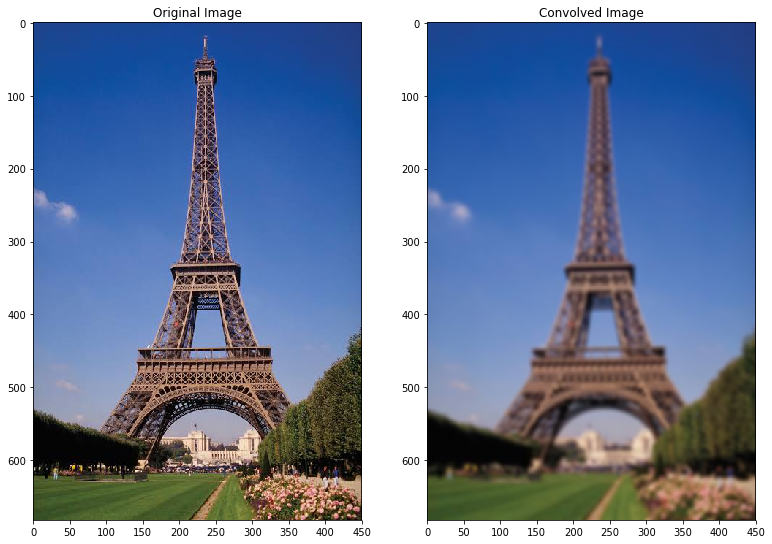

In [31]:
convolution("Images/Images/eiffel.jpeg", np.array([0.001283,0.002106,0.003096,0.004077,0.004809,0.005081,0.004809,0.004077,0.003096,0.002106,0.0012]), np.array([0.001283,0.002106,0.003096,0.004077,0.004809,0.005081,0.004809,0.004077,0.003096,0.002106,0.0012]), kernel_type= 'gaussian', print_image=True)

## Box filter

Using a 3x3 Box filter given as follows : <br>
$\begin{pmatrix}1 & 1 & 1\\\ 1 & 1 & 1\\\ 1 & 1 & 1 \end{pmatrix} * 1/9$

Dimension of the image :  (256, 256)
Max :  253
Min :  7
Image format :  TIFF
Image Mode :  L


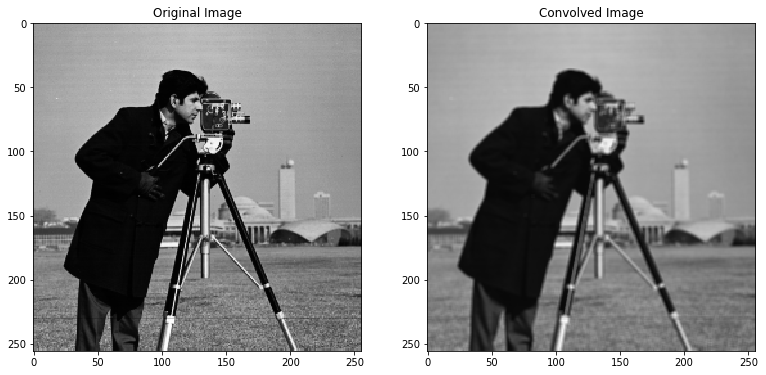

In [32]:
convolution("Images/Images/cameraman.tif", np.array([1,1,1]), np.array([1,1,1]), kernel_type= 'box', print_image=True)

#### Using a 5x5 Box filter with the vertical and horizontal kernel vector is $[1,1,1,1,1]$

Dimension of the image :  (256, 256)
Max :  253
Min :  7
Image format :  TIFF
Image Mode :  L


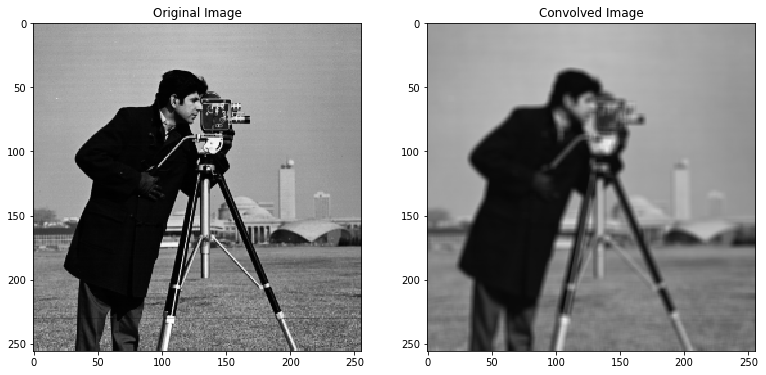

In [33]:
convolution("Images/Images/cameraman.tif", np.array([1,1,1,1,1]), np.array([1,1,1,1,1]), kernel_type= 'box', print_image=True)

#### Using a 7x7 Box filter with the vertical and horizontal kernel vector is $[1,1,1,1,1,1,1]$

Dimension of the image :  (256, 256)
Max :  253
Min :  7
Image format :  TIFF
Image Mode :  L


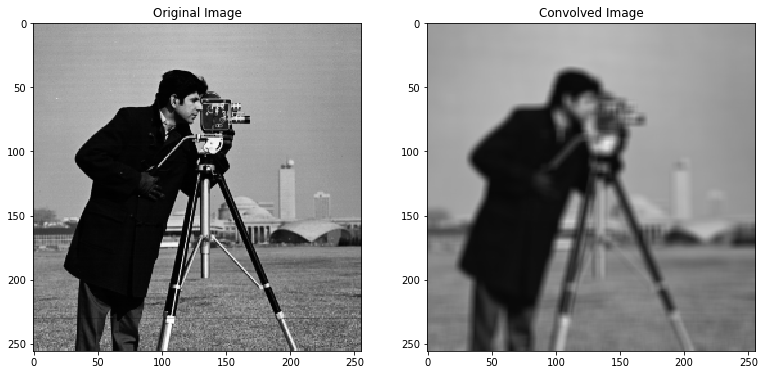

In [34]:
convolution("Images/Images/cameraman.tif", np.array([1,1,1,1,1,1,1]), np.array([1,1,1,1,1,1,1]), kernel_type= 'box', print_image=True)

In [35]:
save_image(convolution("Images/Images/cameraman.tif", np.array([1,1,1,1,1,1,1]), np.array([1,1,1,1,1,1,1]), kernel_type= 'box', print_image=False), "Cameraman_box.jpg")

Dimension of the image :  (256, 256)
Max :  253
Min :  7
Image format :  TIFF
Image Mode :  L


#### Using a 11x11 Box filter with the vertical and horizontal kernel vector is $[1,1,1,1,1,1,1,1,1,1,1]$

Dimension of the image :  (256, 256)
Max :  253
Min :  7
Image format :  TIFF
Image Mode :  L


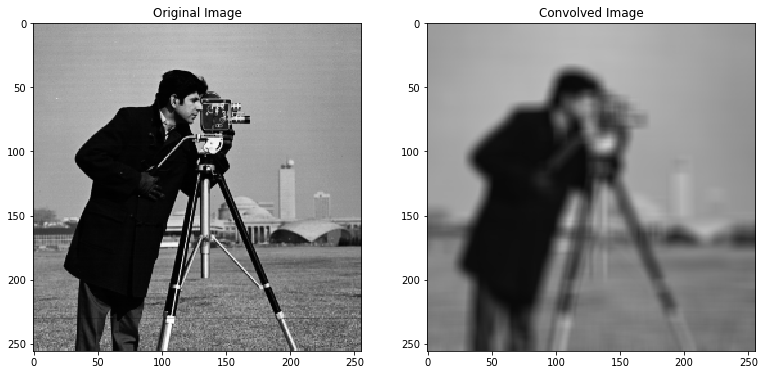

In [36]:
convolution("Images/Images/cameraman.tif", np.array([1,1,1,1,1,1,1,1,1,1,1]), np.array([1,1,1,1,1,1,1,1,1,1,1]), kernel_type= 'box', print_image=True)

## (Q.6) Sharpening image

In [37]:
def Sharpen(image_path, kernel_height, kernel_width, kernel, print_image = True):

    img = cv2.imread(image_path)   
    image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
    blurred = convolution(image_path, kernel_height, kernel_width, kernel_type= kernel, print_image = False)
    sharpened = float(1.0 + 1) * image - float(1.0) * blurred
    sharpened = np.maximum(sharpened, np.zeros(sharpened.shape))
    sharpened = np.minimum(sharpened, 255 * np.ones(sharpened.shape))
    sharpened = sharpened.round().astype(np.uint8)

    if print_image :
        # return the output convoluted image    
        fig = plt.figure(figsize=(20,10))
        
        # Plotting the original and Convoluted image
        fig.add_subplot(131)
        plt.title('Original Image')
        plt.imshow(image)

        fig.add_subplot(132)
        plt.title('Sharpened Image')
        plt.imshow(sharpened)

        plt.show()    
    else:
        return sharpened

Dimension of the image :  (452, 678)
Max :  255
Min :  0
Image format :  JPEG
Image Mode :  RGB
The kernel used is : 
 [[ 1  4  6  4  1]
 [ 4 16 24 16  4]
 [ 6 24 36 24  6]
 [ 4 16 24 16  4]
 [ 1  4  6  4  1]] 0.00390625


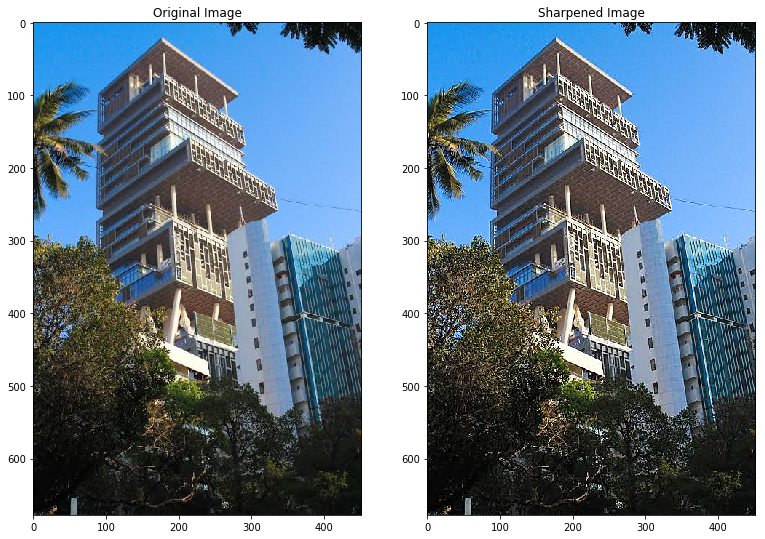

In [39]:
Sharpen("Images/Images/antilla.jpeg", np.array([1,  4,  6,  4,  1]), np.array([1,  4,  6,  4,  1]), kernel = 'gaussian')

In [40]:
save_image(Sharpen("Images/Images/antilla.jpeg", np.array([1,  4,  6,  4,  1]), np.array([1,  4,  6,  4,  1]),kernel = 'gaussian', print_image = False), "antilla_sharped_gaussian.jpg")

Dimension of the image :  (452, 678)
Max :  255
Min :  0
Image format :  JPEG
Image Mode :  RGB
The kernel used is : 
 [[ 1  4  6  4  1]
 [ 4 16 24 16  4]
 [ 6 24 36 24  6]
 [ 4 16 24 16  4]
 [ 1  4  6  4  1]] 0.00390625


Dimension of the image :  (452, 678)
Max :  255
Min :  0
Image format :  JPEG
Image Mode :  RGB


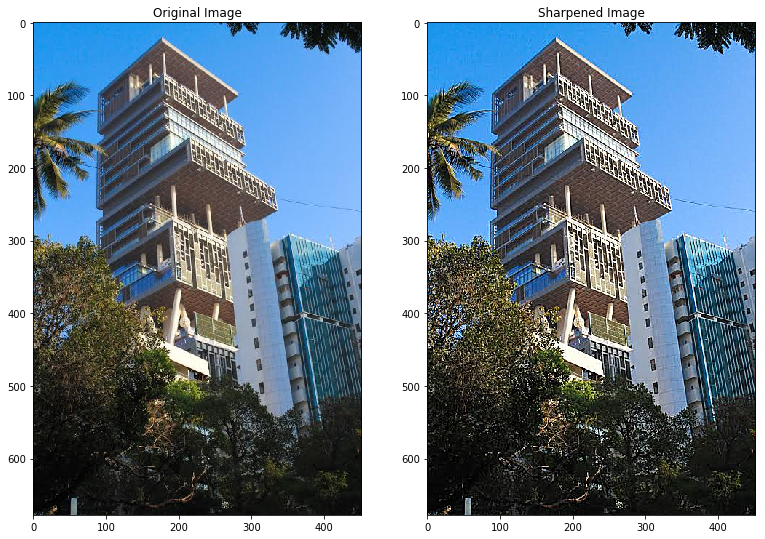

In [41]:
Sharpen("Images/Images/antilla.jpeg", np.array([1,  1,  1,  1,  1]), np.array([1,  1,  1,  1,  1]), kernel = 'box')

In [42]:
save_image(Sharpen("Images/Images/antilla.jpeg", np.array([1,  1,  1,  1,  1]), np.array([1,  1,  1,  1,  1]),kernel = 'box', print_image = False), "antilla_sharped_box.jpg")

Dimension of the image :  (452, 678)
Max :  255
Min :  0
Image format :  JPEG
Image Mode :  RGB


## (Q.7) Median Filter

Median Filter with a $3*3$ kernel : <br>
$\begin{pmatrix}1 & 1 & 1\\\ 1 & 1 & 1\\\ 1 & 1 & 1 \end{pmatrix} * 1/9$

Dimension of the image :  (660, 464)
Max :  255
Min :  0
Image format :  JPEG
Image Mode :  RGB


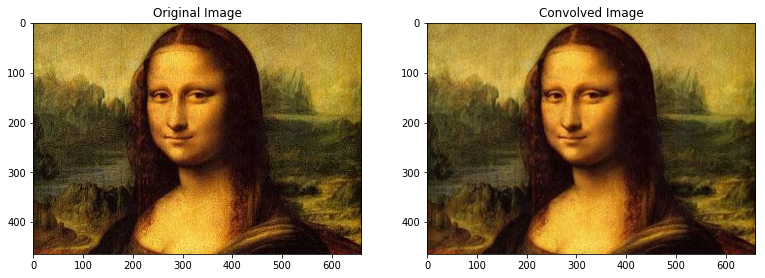

In [43]:
monalisa_3 = convolution("Images/Images/monalisa.jpeg", np.array([1, 1, 1]), np.array([1, 1, 1]), kernel_type= 'median', print_image = True)

Median Filter with $5*5$ filter with horizontal kernel vector is $[1,1,1,1,1]$

Dimension of the image :  (660, 464)
Max :  255
Min :  0
Image format :  JPEG
Image Mode :  RGB


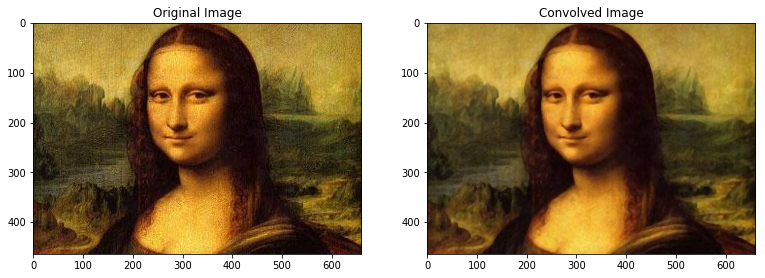

In [44]:
monalisa_5 = convolution("Images/Images/monalisa.jpeg", np.array([1, 1, 1, 1, 1]), np.array([1, 1, 1, 1, 1]), kernel_type= 'median', print_image = True)

Median Filter with $7*7$ filter with horizontal kernel vector is $[1,1,1,1,1,1,1]$

Dimension of the image :  (660, 464)
Max :  255
Min :  0
Image format :  JPEG
Image Mode :  RGB


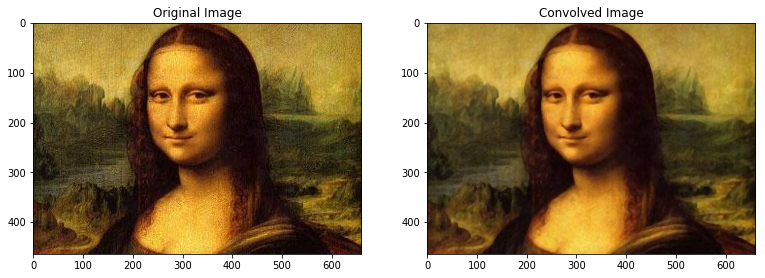

In [45]:
monalisa_7 = convolution("Images/Images/monalisa.jpeg", np.array([1, 1, 1, 1, 1]), np.array([1, 1, 1, 1, 1]), kernel_type= 'median', print_image = True)

In [46]:
save_image(convolution("Images/Images/monalisa.jpeg", np.array([1, 1, 1, 1, 1]), np.array([1, 1, 1, 1, 1]), kernel_type= 'median', print_image = False), "monalisa_median.jpg")

Dimension of the image :  (660, 464)
Max :  255
Min :  0
Image format :  JPEG
Image Mode :  RGB
